# Python samples for chapter 4 - classification and design matrix

Packages used 
1. Numpy
2. Pandas
3. sklearn
4. seaborn
5. graphviz

Need to add the following to juypter-config in versions below 5.2 to enable heavy visualizations

````
$jupyter notebook --generate-config
````

change the following values (uncomment if required) in jupyter_notebook_config.py

````
## (bytes/sec) Maximum rate at which messages can be sent on iopub before they
c.NotebookApp.iopub_data_rate_limit = 10000000000
## (msgs/sec) Maximum rate at which messages can be sent on iopub before they are
c.NotebookApp.iopub_msg_rate_limit = 100000
````

# Estimator Example

In [1]:
import numpy as np
np.random.seed(200)
nsamples = 100
ndraws = 100
sequences_100 = np.array([])
separate_100 = np.empty((ndraws,nsamples))

for idx in range(ndraws):
  values = np.round(np.random.normal(100,20,nsamples))
  sequences_100 = np.concatenate((sequences_100, values ))
  separate_100[idx,:] = values

print(np.mean(sequences_100))
print(np.std(sequences_100))
print(np.mean(np.mean(separate_100,axis=1)))
print(np.std(np.mean(separate_100,axis=1)))

99.6832
19.817821216268957
99.6832
2.030253619624898


# Central Limit Theorem Illustration

/Users/kitoo/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


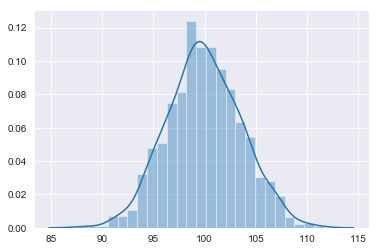

In [2]:
import numpy as np
import seaborn as sns
%matplotlib inline
np.random.seed(200)
nsamples = 30
ndraws = 1000
sequences_1000 = np.array([])
separate_1000 = np.empty((ndraws,nsamples))

for idx in range(ndraws):
  values = np.round(np.random.normal(100,20,nsamples))
  sequences_1000 = np.concatenate((sequences_1000, values ))
  separate_1000[idx,:] = values

sns.set_style('darkgrid')
sns.distplot(np.mean(separate_1000,axis=1))

In [3]:
print(np.mean(sequences_1000))
print(np.std(sequences_1000))
print(np.mean(np.mean(separate_1000,axis=1)))
print(np.std(np.mean(separate_1000,axis=1)))

99.96503333333334
19.90130675773718
99.96503333333332
3.596914819829782


# Plot distribution of means

100.0039916
20.00348473309413
100.00399159999999
0.20569556536162847


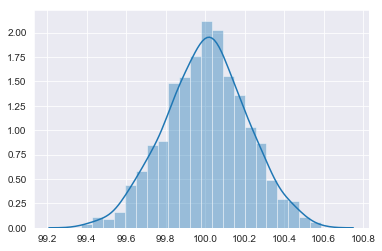

In [4]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

np.random.seed(200)
nsamples = 10000
ndraws = 1000
sequences_1000 = np.array([])

separate_1000 = np.empty((ndraws,nsamples))
for idx in range(ndraws):
  values = np.round(np.random.normal(100,20,nsamples))
  sequences_1000 = np.concatenate((sequences_1000, values ))
  separate_1000[idx,:] = values
  
sns.distplot(np.mean(separate_1000,axis=1))
plt.savefig("clt_hist.png",dpi=300)

print(np.mean(sequences_1000))
print(np.std(sequences_1000))
print(np.mean(np.mean(separate_1000,axis=1)))
print(np.std(np.mean(separate_1000,axis=1)))


# Pair plot for Iris species dataset

/Users/kitoo/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/Users/kitoo/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/Users/kitoo/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/Users/kitoo/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)

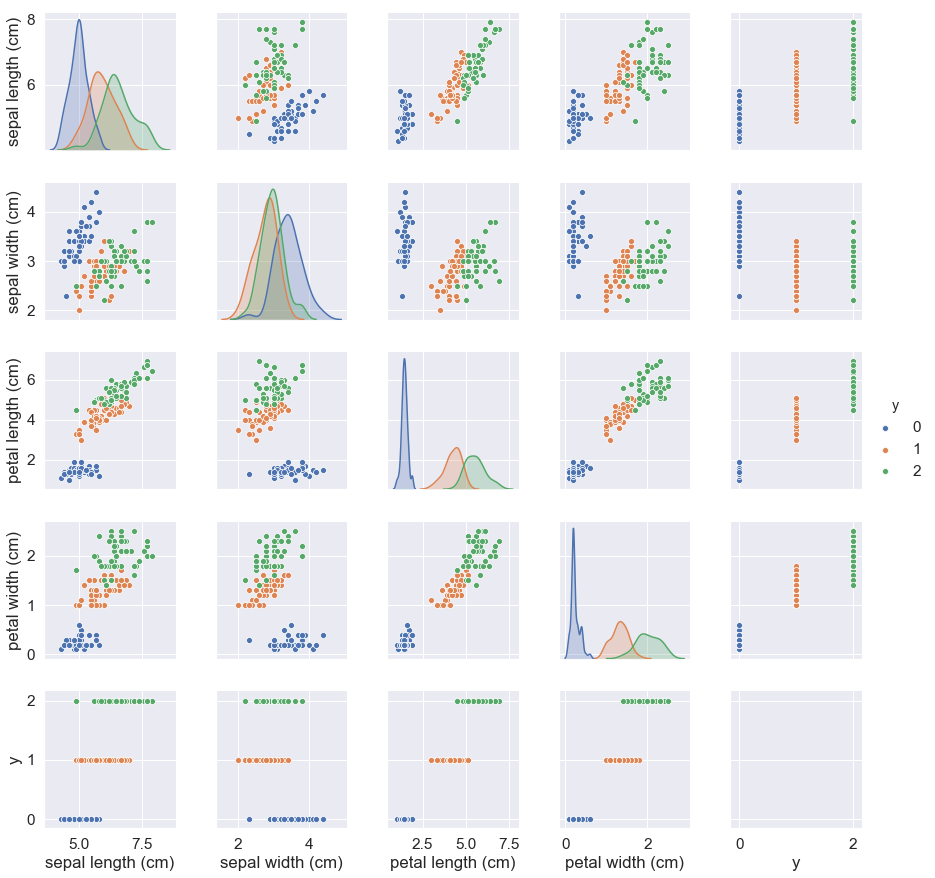

In [5]:
from sklearn import datasets
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

iris = datasets.load_iris()
df = pd.DataFrame(iris.data)
df.columns = iris.feature_names
df['y'] = iris.target
sns.set(font_scale=1.4)
sns.pairplot(df, hue='y')
plt.savefig('pairplot.png',dpi=300)

# Pairplot for snakes with rattle index

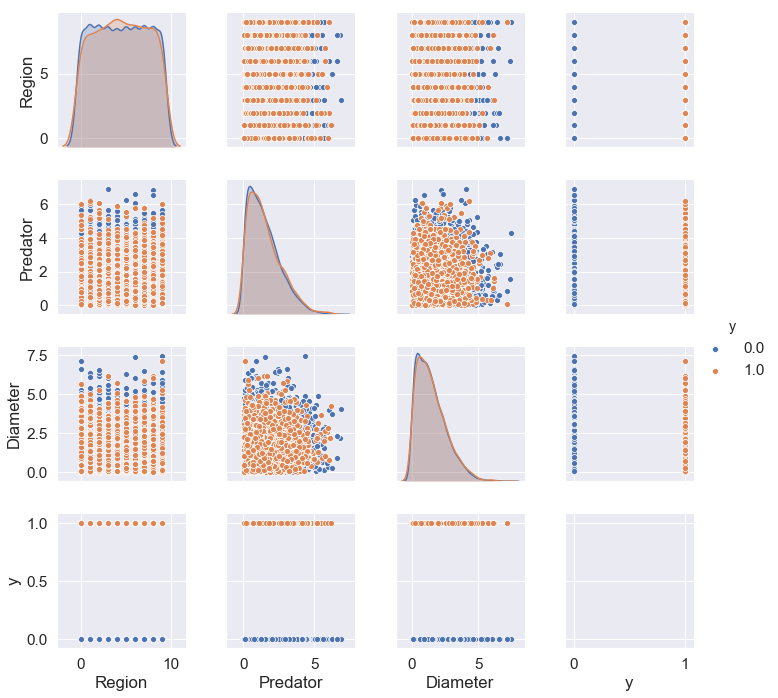

In [6]:
from sklearn import datasets
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd

data = pd.read_csv('~/Dropbox/packt/snakes_edit.csv')

df = data.loc[:,['Region','Predator','Diameter']]
df['y'] = data['Rattle']
df.loc[df['y']>0,'y'] = 1
sns.set(font_scale=1.4)
sns.pairplot(df, hue='y')
plt.savefig('pairplot_snakes.png',dpi=300)

# Explore collinearity in dataset

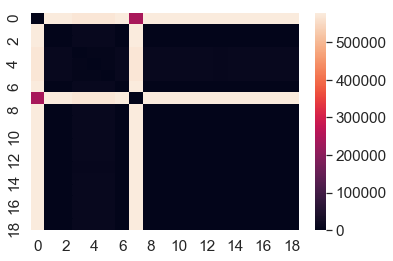

In [7]:
import matplotlib.pyplot as plt
from sklearn.metrics import pairwise_distances
import seaborn as sns
import pandas as pd
%matplotlib inline

# read csv
data = pd.read_csv('~/Dropbox/packt/snakes_edit.csv')
# compute Euclidean distance between all pairs of columns
dist_mat = pairwise_distances(data.values.T)
# plot heatmap of distances
sns.heatmap(dist_mat)
plt.savefig('collinearity_euclidean.png',dpi=300)

/Users/kitoo/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/kitoo/anaconda3/lib/python3.7/site-packages/sklearn/base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


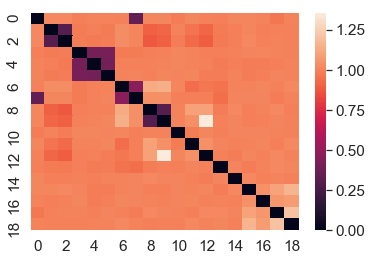

In [8]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import pairwise_distances
import seaborn as sns
import pandas as pd
%matplotlib inline

# read csv
data = pd.read_csv('~/Dropbox/packt/snakes_edit.csv')
# transform the data to have zero mean and unit variance
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)
# compute cosine distance between all pairs of columns
dist_mat = pairwise_distances(scaled_data.T, metric='cosine')
# plot heatmap of distances
sns.heatmap(dist_mat)
plt.savefig('collinearity_cosine.png',dpi=300)

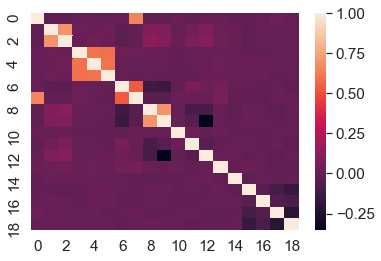

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd
%matplotlib inline

# read csv
data = pd.read_csv('~/Dropbox/packt/snakes_edit.csv')
# compute correlation coefficient
dist_mat = np.corrcoef(data, rowvar=0)
# plot heatmap of correlation coefficients
sns.heatmap(dist_mat)
plt.savefig('collinearity_correlation.png',dpi=300)

# Logistic Regression Illustration

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    1.2s finished


MAE: 6


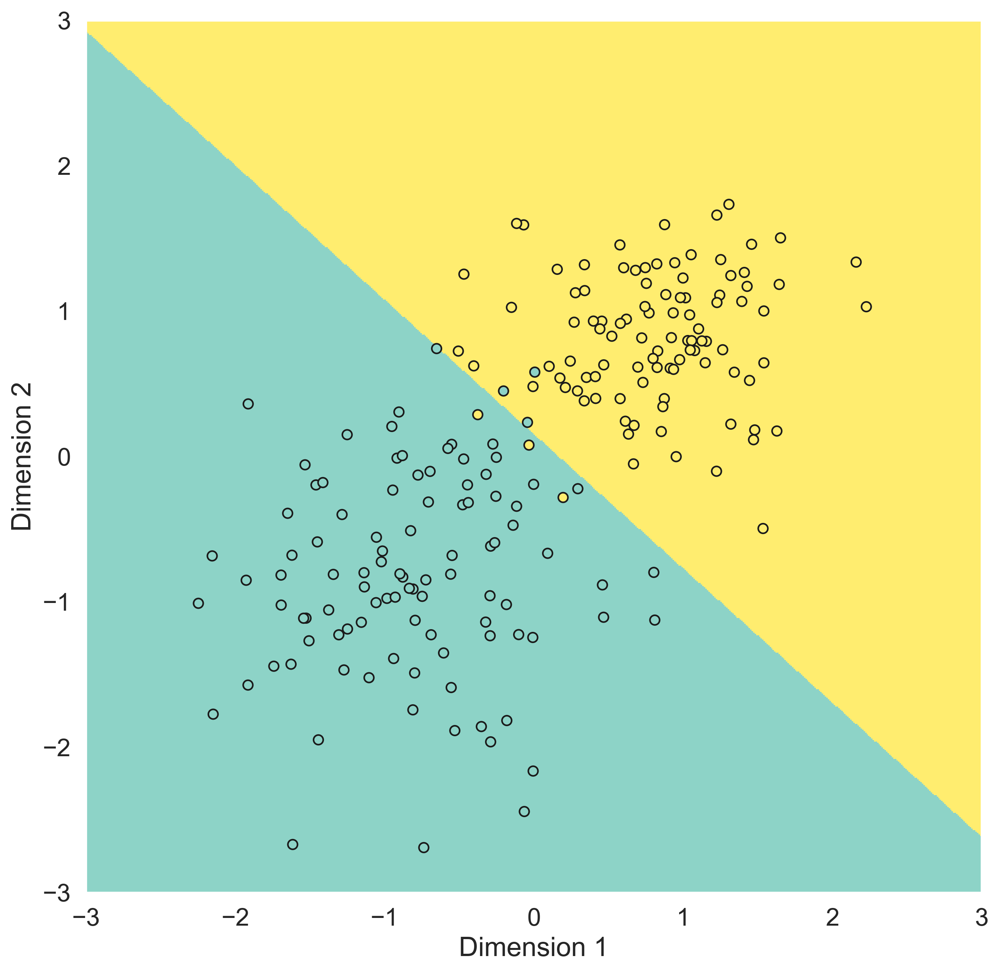

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn.linear_model
import sklearn.preprocessing as preprocessing
%matplotlib inline

# generate data with gaussian clusters
np.random.seed(10)
cov1 = np.array(([10,1],[1,10]))
mean1 = np.array([35,35])
data1 = np.random.multivariate_normal(mean1, cov1,100)
df1 = pd.DataFrame(data1, columns=['dim1','dim2'])
df1['label'] = 1

mean2 = np.array([25,25])
cov1 = np.array(([20,0.5],[0.5,20]))
data2 = np.random.multivariate_normal(mean2, cov1,100)
df2 = pd.DataFrame(data2, columns=['dim1','dim2'])
df2['label'] = 0

df = pd.concat((df1,df2))
X = df.loc[:,['dim1','dim2']]
y = df['label']

# Transform the data to have zero mean and unit variance
scaler = preprocessing.StandardScaler().fit(X)
X_train = scaler.transform(X)

# Define estimator as logistic regression
# with sovler lbfgs, fit_intercept=True, n_jobs=2, verbose=1
estimator = sklearn.linear_model.LogisticRegression(solver='lbfgs',fit_intercept=True, n_jobs=2, verbose=1)
# fit the estimator to data
classifier = estimator.fit(X_train,y)
# predict the data labels to see the learned function
y_hat = classifier.predict(X_train)

# print the mean absolute error of the classifer
print("MAE:", np.sum(np.abs(y-y_hat)) )

# plot decision surface of the classifier
plt.figure(figsize=(10,10),dpi=300)

# define boundaries for plane
x_min, x_max = -6,6
y_min, y_max = -6,6
h = .01  # step size in the mesh
# generate mesh of points on 2 dimensions
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
# predict classes for all mesh of points on 2 dimensions
Z = classifier.predict(np.stack((xx.ravel(),yy.ravel()), axis=1))

# reshape Z to fit shape for plotting
Z = Z.reshape(xx.shape)
plt.figure(1, figsize=(4, 3))
plt.rcParams.update({'font.size': 22})
# Put the result into a color plot
plt.pcolormesh(xx, yy, Z, cmap=plt.cm.Set3)
# plot the training points as circles
plt.scatter(X_train[:, 0], X_train[:, 1], c=y, edgecolors='k', cmap=plt.cm.Set3)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.xlim(-3,3)
plt.ylim(-3,3)
plt.savefig('logistic_plane.png',dpi=300)

# Exercise for logistic regression

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    0.7s finished


MAE: 7


(1, 30)

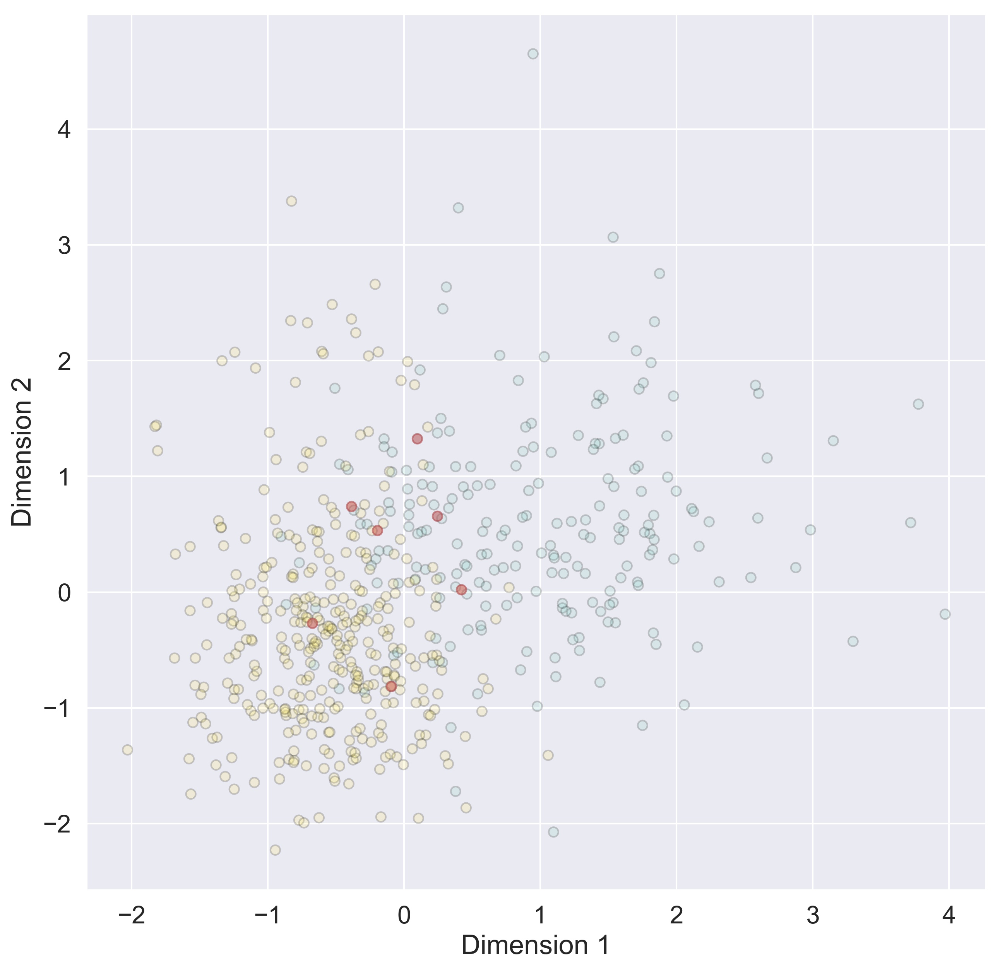

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn.linear_model
from sklearn.datasets import load_breast_cancer
import sklearn.preprocessing as preprocessing
%matplotlib inline

# use data from wine tasting
cancer = load_breast_cancer()
df = pd.DataFrame(cancer.data)
df.columns = cancer.feature_names
y = cancer.target

# # Transform the data to have zero mean and unit variance
scaler = preprocessing.StandardScaler().fit(df.values)
X_train = scaler.transform(df.values)

# # Define estimator as logistic regression
# # with sovler lbfgs, fit_intercept=True, n_jobs=2, verbose=1
estimator = sklearn.linear_model.LogisticRegression(solver='lbfgs',fit_intercept=True, n_jobs=2, verbose=1)
# # fit the estimator to data
classifier = estimator.fit(X_train,y)
# # predict the data labels to see the learned function
y_hat = classifier.predict(X_train)

# # print the mean absolute error of the classifer
print("MAE:", np.sum(np.abs(y-y_hat)) )

from sklearn.manifold import MDS
embedding = MDS(n_components=2)
X_transformed = embedding.fit_transform(X_train)


# # plot decision surface of the classifier
plt.figure(figsize=(10,10),dpi=300)
plt.rcParams.update({'font.size': 22})
# # Put the result into a color plot
# plt.pcolormesh(xx, yy, Z, cmap=plt.cm.Set3)
# # plot the training points as circles
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_hat, edgecolors='k', cmap=plt.cm.Set3, alpha=0.2)
# plot misclassified points with red outline
plt.scatter(X_train[np.where(y!=y_hat), 0], X_train[np.where(y!=y_hat), 1], c='r', alpha=0.5)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
# plt.xlim(-3,3)
# plt.ylim(-3,3)
plt.savefig('logistic_exercise_plane.png',dpi=300)
classifier.coef_.shape

# Decision Tree illustration

df shape (400, 3)


<Figure size 3000x3000 with 0 Axes>

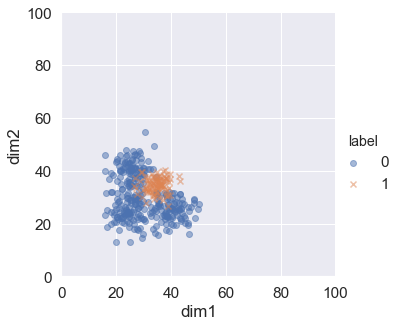

In [13]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# create dataset
np.random.seed(10)
cov1 = np.array(([10,1],[1,10]))
mean1 = np.array([35,35])
data1 = np.random.multivariate_normal(mean1, cov1,100)
df1 = pd.DataFrame(data1, columns=['dim1','dim2'])
df1['label'] = 1
mean2 = np.array([25,25])
cov1 = np.array(([20,0.5],[0.5,20]))
data2 = np.random.multivariate_normal(mean2, cov1,100)
df2 = pd.DataFrame(data2, columns=['dim1','dim2'])
df2['label'] = 0
mean3 = np.array([25,40])
data3 = np.random.multivariate_normal(mean3, cov1,100)
df3 = pd.DataFrame(data3, columns=['dim1','dim2'])
df3['label'] = 0
mean4 = np.array([40,25])
data4 = np.random.multivariate_normal(mean4, cov1,100)
df4 = pd.DataFrame(data4, columns=['dim1','dim2'])
df4['label'] = 0

# plot dataset
df = pd.concat((df1,df2,df3,df4))
plt.figure(figsize=(10,10),dpi=300)
sns.set_style('darkgrid')
print("df shape",df.shape)
p = sns.lmplot(data=df, x='dim1', y='dim2', fit_reg=False, hue='label',  markers=["o", "x"], scatter_kws={'alpha':0.5})
p.axes[0,0].set_xlim(0,100)
p.axes[0,0].set_ylim(0,100)
plt.savefig('decision-tree.png',dpi=300)


In [14]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

np.random.seed(10)
cov1 = np.array(([10,1],[1,10]))
mean1 = np.array([35,35])
data1 = np.random.multivariate_normal(mean1, cov1,100)
df1 = pd.DataFrame(data1, columns=['dim1','dim2'])
df1['label'] = 1

mean2 = np.array([25,25])
cov1 = np.array(([20,0.5],[0.5,20]))
data2 = np.random.multivariate_normal(mean2, cov1,100)
df2 = pd.DataFrame(data2, columns=['dim1','dim2'])
df2['label'] = 0

mean3 = np.array([25,40])
data3 = np.random.multivariate_normal(mean3, cov1,100)
df3 = pd.DataFrame(data3, columns=['dim1','dim2'])
df3['label'] = 0

mean4 = np.array([40,25])
data4 = np.random.multivariate_normal(mean4, cov1,100)
df4 = pd.DataFrame(data4, columns=['dim1','dim2'])
df4['label'] = 0

df = pd.concat((df1,df2,df3,df4))


In [18]:
from sklearn import tree
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# generate data
np.random.seed(10)
cov1 = np.array(([10,1],[1,10]))
mean1 = np.array([35,35])
data1 = np.random.multivariate_normal(mean1, cov1,100)
df1 = pd.DataFrame(data1, columns=['dim1','dim2'])
df1['label'] = 1

mean2 = np.array([25,25])
cov1 = np.array(([20,0.5],[0.5,20]))
data2 = np.random.multivariate_normal(mean2, cov1,100)
df2 = pd.DataFrame(data2, columns=['dim1','dim2'])
df2['label'] = 0

mean3 = np.array([25,40])
data3 = np.random.multivariate_normal(mean3, cov1,100)
df3 = pd.DataFrame(data3, columns=['dim1','dim2'])
df3['label'] = 0

mean4 = np.array([40,25])
data4 = np.random.multivariate_normal(mean4, cov1,100)
df4 = pd.DataFrame(data4, columns=['dim1','dim2'])
df4['label'] = 0

# combine clusters
df = pd.concat((df1,df2,df3,df4))
X_train = df.iloc[:,0:2]
y = df['label']

# Define estimator as Decision Tree
estimator = tree.DecisionTreeClassifier(criterion='gini', max_depth=2)
# fit the estimator to data
classifier = estimator.fit(X_train,y)
# predict the data labels to see the learned function
y_hat = classifier.predict(X_train)

# print the mean absolute error of the classifer
print("MAE:", np.sum(np.abs(y-y_hat)) )

# identify number of nodes in decision tree
path = classifier.decision_path(X_train)
print("Number of nodes:",path.shape[1])

# # Define estimator as logistic regression
# # with sovler lbfgs, fit_intercept=True, n_jobs=2, verbose=1
# estimator = sklearn.linear_model.LogisticRegression(solver='lbfgs',fit_intercept=True, n_jobs=2, verbose=1)
# # fit the estimator to data
# classifier = estimator.fit(X_train,y)
# # predict the data labels to see the learned function
# y_hat = classifier.predict(X_train)

# # print the mean absolute error of the classifer
# print("MAE:", np.sum(np.abs(y-y_hat)) )
# MAE: 106

MAE: 31
Number of nodes: 7


In [19]:
# plot decision tree using graphviz
import graphviz
dot_data = tree.export_graphviz(classifier, out_file=None)
graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render("non-linear")

'non-linear.png'

df shape (400, 3)


<Figure size 3000x3000 with 0 Axes>

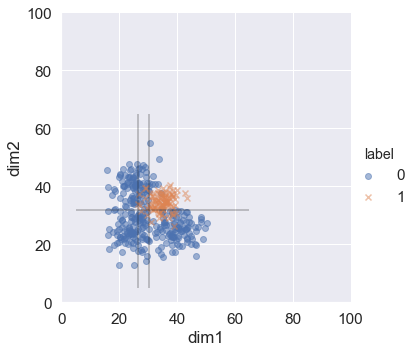

In [20]:
# plot decision lines from 2 splits
plt.figure(figsize=(10,10),dpi=300)
sns.set_style('darkgrid')
print("df shape",df.shape)
p = sns.lmplot(data=df, x='dim1', y='dim2', fit_reg=False, hue='label',  markers=["o", "x"], scatter_kws={'alpha':0.5})
p.axes[0,0].set_xlim(0,100)
p.axes[0,0].set_ylim(0,100)
plt.vlines([30.334,26.58],ymin=5,ymax=65, alpha=0.3)
plt.hlines([31.857],xmin=5,xmax=65, alpha=0.3)
plt.savefig('decision-tree-lines.png',dpi=300)

# Exercise for decision Tree

MAE: 3
Number of nodes: 35


'decision_exercise.png'

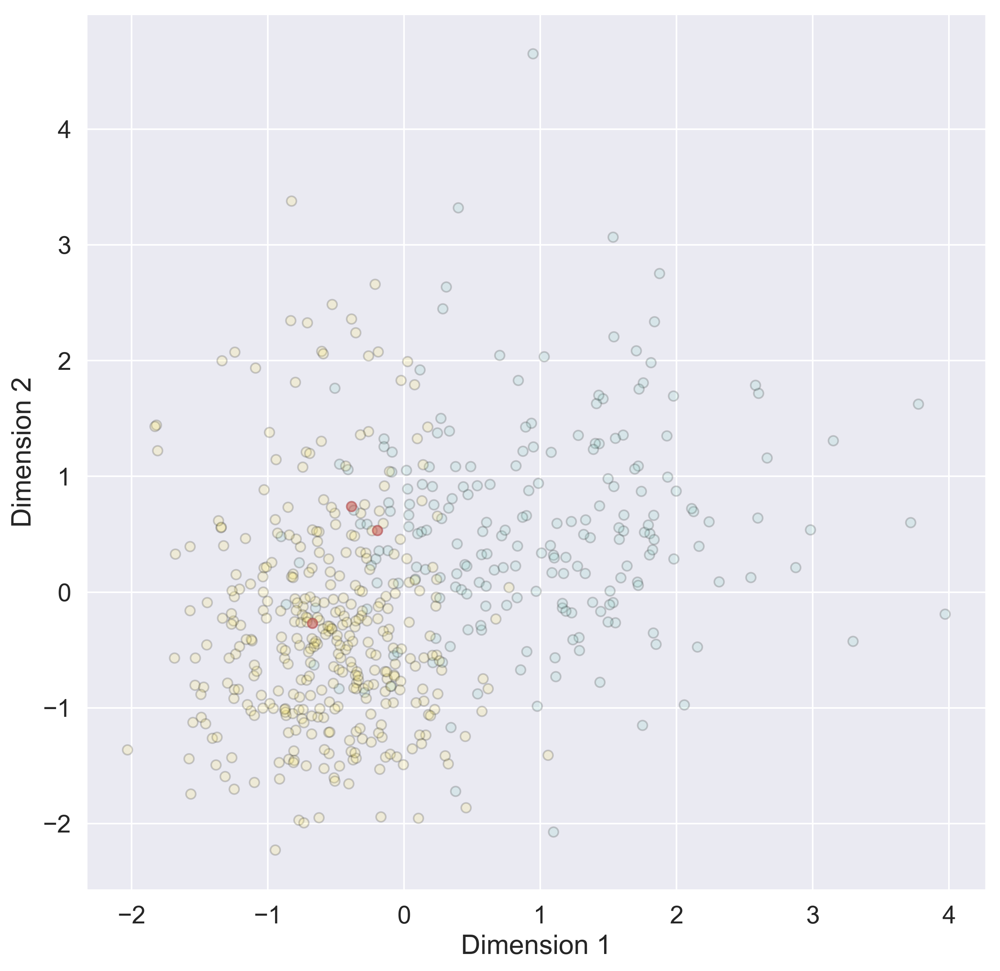

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.datasets import load_breast_cancer
import sklearn.preprocessing as preprocessing
%matplotlib inline

# use data from wine tasting
cancer = load_breast_cancer()
df = pd.DataFrame(cancer.data)
df.columns = cancer.feature_names
y = cancer.target

# Transform the data to have zero mean and unit variance
scaler = preprocessing.StandardScaler().fit(df.values)
X_train = scaler.transform(df.values)

# Define estimator as Decision Tree
estimator = tree.DecisionTreeClassifier(max_depth=5)
# fit the estimator to data
classifier = estimator.fit(X_train,y)
# predict the data labels to see the learned function
y_hat = classifier.predict(X_train)

# print the mean absolute error of the classifer
print("MAE:", np.sum(np.abs(y-y_hat)) )

from sklearn.manifold import MDS
embedding = MDS(n_components=2)
X_transformed = embedding.fit_transform(X_train)

# plot decision surface of the classifier
plt.figure(figsize=(10,10),dpi=300)
plt.rcParams.update({'font.size': 22})
# plot the training points as circles
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_hat, edgecolors='k', cmap=plt.cm.Set3, alpha=0.2)
# plot misclassified points with red outline
plt.scatter(X_train[np.where(y!=y_hat), 0], X_train[np.where(y!=y_hat), 1], c='r', alpha=0.5)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.savefig('decision_tree_exercise_plane.png',dpi=300)

path = classifier.decision_path(X_train)
print("Number of nodes:",path.shape[1])

# visualization of decision tree 
import graphviz
dot_data = tree.export_graphviz(classifier, out_file=None)
graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render("decision_exercise")


# Support Vector Machine Illustration

df shape (200, 3)


<Figure size 3000x3000 with 0 Axes>

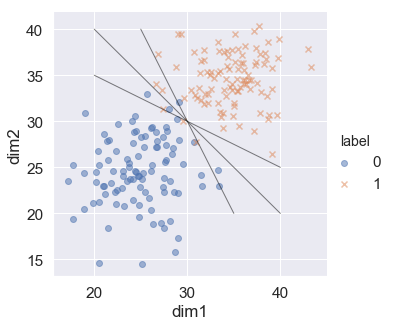

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as lines

np.random.seed(10)
cov1 = np.array(([10,1],[1,10]))
mean1 = np.array([35,35])
data1 = np.random.multivariate_normal(mean1, cov1,100)
df1 = pd.DataFrame(data1, columns=['dim1','dim2'])
df1['label'] = 1

mean2 = np.array([25,25])
cov1 = np.array(([15,0.5],[0.5,15]))
data2 = np.random.multivariate_normal(mean2, cov1,100)
df2 = pd.DataFrame(data2, columns=['dim1','dim2'])
df2['label'] = 0

df = pd.concat((df1,df2))
plt.figure(figsize=(10,10),dpi=300)
sns.set_style('darkgrid')
print("df shape",df.shape)
p = sns.lmplot(data=df, x='dim1', y='dim2', fit_reg=False, hue='label', markers=["o", "x"], scatter_kws={'alpha':0.5})
line1 = lines.Line2D([20,40],[40,20],lw=1, color='black',alpha=0.5)
p.axes[0,0].add_line(line1)
line2 = lines.Line2D([25,35],[40,20],lw=1, color='black',alpha=0.5)
p.axes[0,0].add_line(line2)
line3 = lines.Line2D([20,40],[35,25],lw=1, color='black',alpha=0.5)
p.axes[0,0].add_line(line3)
plt.savefig('svm-lines.png',dpi=300)

df shape (200, 3)


<Figure size 3000x3000 with 0 Axes>

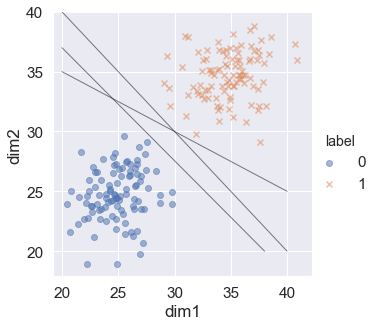

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as lines
from sklearn import svm

np.random.seed(10)
cov1 = np.array(([5,1],[1,5]))
mean1 = np.array([35,35])
data1 = np.random.multivariate_normal(mean1, cov1,100)
df1 = pd.DataFrame(data1, columns=['dim1','dim2'])
df1['label'] = 1

mean2 = np.array([25,25])
cov1 = np.array(([5,0.5],[0.5,5]))
data2 = np.random.multivariate_normal(mean2, cov1,100)
df2 = pd.DataFrame(data2, columns=['dim1','dim2'])
df2['label'] = 0

df = pd.concat((df1,df2))

plt.figure(figsize=(10,10),dpi=300)
sns.set_style('darkgrid')
print("df shape",df.shape)
p = sns.lmplot(data=df, x='dim1', y='dim2', fit_reg=False, hue='label',  markers=["o", "x"], scatter_kws={'alpha':0.5})
line1 = lines.Line2D([20,40],[40,20],lw=1, color='black',alpha=0.5)
p.axes[0,0].add_line(line1)
line2 = lines.Line2D([20,38],[37,20],lw=1, color='black',alpha=0.5)
p.axes[0,0].add_line(line2)
line3 = lines.Line2D([20,40],[35,25],lw=1, color='black',alpha=0.5)
p.axes[0,0].add_line(line3)
plt.savefig('svm-lines2.png',dpi=300)

[LibSVM]MAE: 0
Number of support vectors:  [1 2]


<Figure size 3000x3000 with 0 Axes>

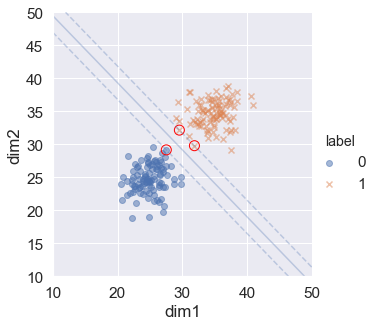

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as lines
from sklearn import svm

# Generate data
np.random.seed(10)
cov1 = np.array(([5,1],[1,5]))
mean1 = np.array([35,35])
data1 = np.random.multivariate_normal(mean1, cov1,100)
df1 = pd.DataFrame(data1, columns=['dim1','dim2'])
df1['label'] = 1

mean2 = np.array([25,25])
cov1 = np.array(([5,0.5],[0.5,5]))
data2 = np.random.multivariate_normal(mean2, cov1,100)
df2 = pd.DataFrame(data2, columns=['dim1','dim2'])
df2['label'] = 0

df = pd.concat((df1,df2))

X_train = df.iloc[:,0:2]
y = df['label']

# Define estimator as SVM classifier
estimator = svm.SVC(kernel='linear', gamma='auto', verbose=True)
# fit the estimator to data
classifier = estimator.fit(X_train,y)
# predict the data labels to see the learned function
y_hat = classifier.predict(X_train)
# print the mean absolute error of the classifer
print("MAE:", np.sum(np.abs(y-y_hat)) )
# print number of support vectors used for estimation
print("Number of support vectors: ", classifier.n_support_)

# Generate grid of points for plotting decision surface
xx = np.linspace(10, 50, 50)
yy = np.linspace(10, 50, 50)
YY, XX = np.meshgrid(yy, xx)
xy = np.vstack([XX.ravel(), YY.ravel()]).T
# decision surface from classifier
Z = classifier.decision_function(xy).reshape(XX.shape)

# plot decision surface
plt.figure(figsize=(10,10),dpi=300)
sns.set_style('darkgrid')
# plot training data
p = sns.lmplot(data=df, x='dim1', y='dim2', fit_reg=False, hue='label',  
               markers=["o", "x"], scatter_kws={'alpha':0.5})
# plot decision surface contour
p.axes[0,0].contour(XX, YY, Z, colors='b', levels=[-1, 0, 1], alpha=0.3,
           linestyles=['--', '-', '--'])
# plot support vectors
p.axes[0,0].scatter(classifier.support_vectors_[:, 0], classifier.support_vectors_[:, 1], s=100,
           linewidth=1, facecolors='none', edgecolors='red')
plt.savefig('svm-lines3.png',dpi=300)

# SVM for non-linear surface with a linear kernel fails

[LibSVM]MAE: 100
Number of support vectors:  [107 100]


<Figure size 3000x3000 with 0 Axes>

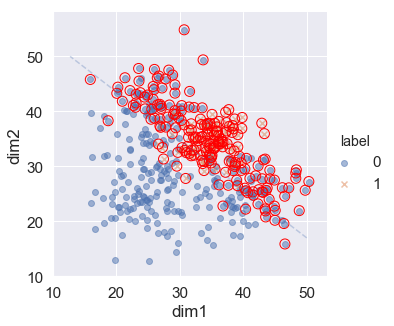

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as lines
from sklearn import svm

# generate data
np.random.seed(10)
cov1 = np.array(([10,1],[1,10]))
mean1 = np.array([35,35])
data1 = np.random.multivariate_normal(mean1, cov1,100)
df1 = pd.DataFrame(data1, columns=['dim1','dim2'])
df1['label'] = 1

mean2 = np.array([25,25])
cov1 = np.array(([20,0.5],[0.5,20]))
data2 = np.random.multivariate_normal(mean2, cov1,100)
df2 = pd.DataFrame(data2, columns=['dim1','dim2'])
df2['label'] = 0

mean3 = np.array([25,40])
data3 = np.random.multivariate_normal(mean3, cov1,100)
df3 = pd.DataFrame(data3, columns=['dim1','dim2'])
df3['label'] = 0

mean4 = np.array([40,25])
data4 = np.random.multivariate_normal(mean4, cov1,100)
df4 = pd.DataFrame(data4, columns=['dim1','dim2'])
df4['label'] = 0

df = pd.concat((df1,df2,df3,df4))

X_train = df.iloc[:,0:2]
y = df['label']

# Define estimator as SVM classifier
estimator = svm.SVC(kernel='linear', gamma='auto', verbose=True)
# fit the estimator to data
classifier = estimator.fit(X_train,y)
# predict the data labels to see the learned function
y_hat = classifier.predict(X_train)
# print the mean absolute error of the classifer
print("MAE:", np.sum(np.abs(y-y_hat)) )
# print number of support vectors used for estimation
print("Number of support vectors: ", classifier.n_support_)

# Generate grid of points for plotting decision surface
xx = np.linspace(10, 50, 50)
yy = np.linspace(10, 50, 50)
YY, XX = np.meshgrid(yy, xx)
xy = np.vstack([XX.ravel(), YY.ravel()]).T
# decision surface from classifier
Z = classifier.decision_function(xy).reshape(XX.shape)

# plot decision surface
plt.figure(figsize=(10,10),dpi=300)
sns.set_style('darkgrid')
# plot training data
p = sns.lmplot(data=df, x='dim1', y='dim2', fit_reg=False, hue='label',  
               markers=["o", "x"], scatter_kws={'alpha':0.5})
# plot decision surface contour
p.axes[0,0].contour(XX, YY, Z, colors='b', levels=[-1, 0, 1], alpha=0.3,
           linestyles=['--', '-', '--'])
# plot support vectors
p.axes[0,0].scatter(classifier.support_vectors_[:, 0], classifier.support_vectors_[:, 1], s=100,
           linewidth=1, facecolors='none', edgecolors='red')
plt.savefig('svm-lines3.png',dpi=300)

# A rbf kernel performs better

[LibSVM]MAE: 29
Number of support vectors:  [44 44]


<Figure size 3000x3000 with 0 Axes>

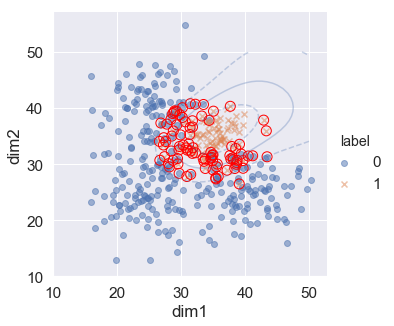

In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as lines
from sklearn import svm

# generate data
np.random.seed(10)
cov1 = np.array(([10,1],[1,10]))
mean1 = np.array([35,35])
data1 = np.random.multivariate_normal(mean1, cov1,100)
df1 = pd.DataFrame(data1, columns=['dim1','dim2'])
df1['label'] = 1

mean2 = np.array([25,25])
cov1 = np.array(([20,0.5],[0.5,20]))
data2 = np.random.multivariate_normal(mean2, cov1,100)
df2 = pd.DataFrame(data2, columns=['dim1','dim2'])
df2['label'] = 0

mean3 = np.array([25,40])
data3 = np.random.multivariate_normal(mean3, cov1,100)
df3 = pd.DataFrame(data3, columns=['dim1','dim2'])
df3['label'] = 0

mean4 = np.array([40,25])
data4 = np.random.multivariate_normal(mean4, cov1,100)
df4 = pd.DataFrame(data4, columns=['dim1','dim2'])
df4['label'] = 0

df = pd.concat((df1,df2,df3,df4))

X_train = df.iloc[:,0:2]
y = df['label']

# Define estimator as SVM classifier
estimator = svm.SVC(kernel='rbf', gamma=0.01, verbose=True)
# fit the estimator to data
classifier = estimator.fit(X_train,y)
# predict the data labels to see the learned function
y_hat = classifier.predict(X_train)
# print the mean absolute error of the classifer
print("MAE:", np.sum(np.abs(y-y_hat)) )
# print number of support vectors used for estimation
print("Number of support vectors: ", classifier.n_support_)

# Generate grid of points for plotting decision surface
xx = np.linspace(10, 50, 50)
yy = np.linspace(10, 50, 50)
YY, XX = np.meshgrid(yy, xx)
xy = np.vstack([XX.ravel(), YY.ravel()]).T
# decision surface from classifier
Z = classifier.decision_function(xy).reshape(XX.shape)

# plot decision surface
plt.figure(figsize=(10,10),dpi=300)
sns.set_style('darkgrid')
# plot training data
p = sns.lmplot(data=df, x='dim1', y='dim2', fit_reg=False, hue='label',  
               markers=["o", "x"], scatter_kws={'alpha':0.5})
# plot decision surface contour
p.axes[0,0].contour(XX, YY, Z, colors='b', levels=[-1, 0, 1], alpha=0.3,
           linestyles=['--', '-', '--'])
# plot support vectors
p.axes[0,0].scatter(classifier.support_vectors_[:, 0], classifier.support_vectors_[:, 1], s=100,
           linewidth=1, facecolors='none', edgecolors='red')
plt.savefig('svm-lines3.png',dpi=300)

# RBF Kernel computation of similarity

In [36]:
from sklearn.metrics.pairwise import rbf_kernel
x = np.array([[1,2],[1,2],[9,10],[10,10]])
y = np.array([[1,2],[2,1],[1,2],[1,2]])
rbf_kernel(x,y, gamma=1)

array([[1.00000000e+00, 1.35335283e-01, 1.00000000e+00, 1.00000000e+00],
       [1.00000000e+00, 1.35335283e-01, 1.00000000e+00, 1.00000000e+00],
       [2.57220937e-56, 3.48110684e-57, 2.57220937e-56, 2.57220937e-56],
       [1.06487866e-63, 1.06487866e-63, 1.06487866e-63, 1.06487866e-63]])

# Exercise for SVM

[LibSVM]MAE: 19


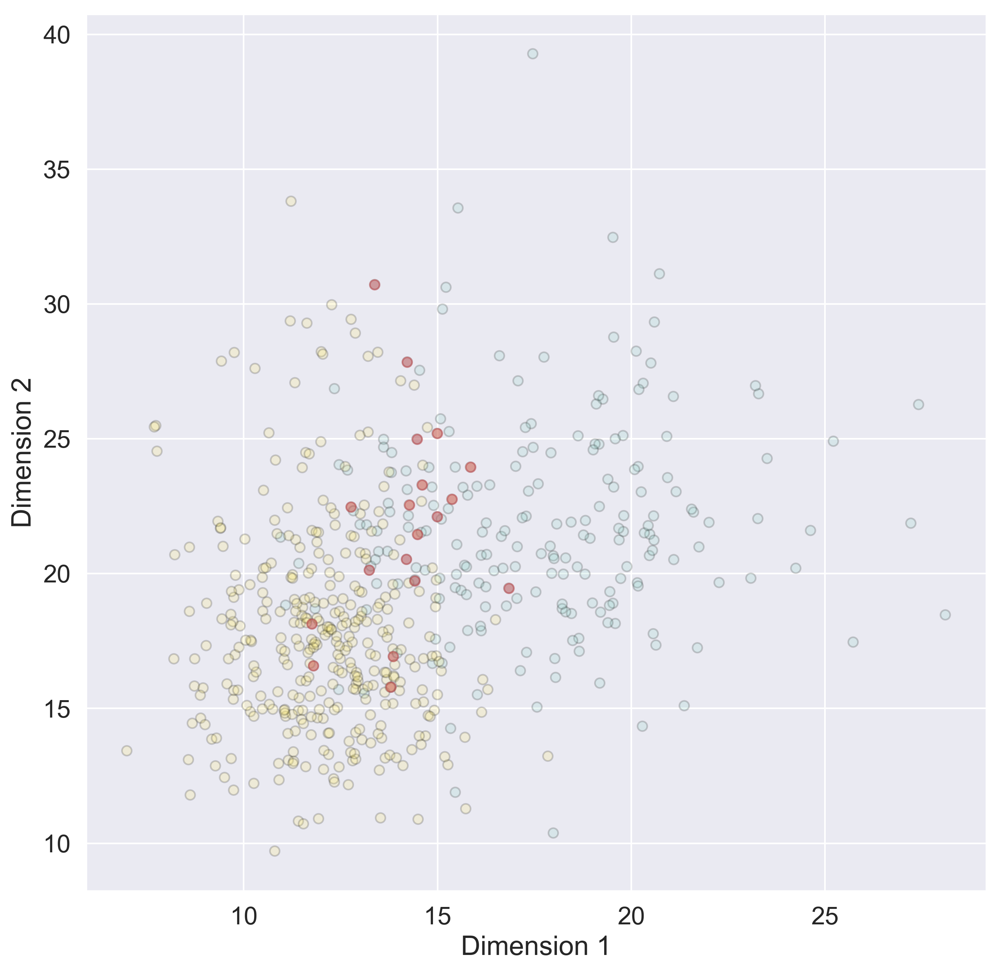

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.datasets import load_breast_cancer
import sklearn.preprocessing as preprocessing
%matplotlib inline

# use data from wine tasting
cancer = load_breast_cancer()
df = pd.DataFrame(cancer.data)
df.columns = cancer.feature_names
y = cancer.target

# set X_train to raw data - SVM does not like scaled tranforms
X_train = df.values

# Define estimator as SVM classifier
estimator = svm.SVC(kernel='linear', gamma=0.1, verbose=True)
# fit the estimator to data
classifier = estimator.fit(X_train,y)
# predict the data labels to see the learned function
y_hat = classifier.predict(X_train)

# # print the mean absolute error of the classifer
print("MAE:", np.sum(np.abs(y-y_hat)) )

from sklearn.manifold import MDS
embedding = MDS(n_components=2)
# from sklearn.manifold import TSNE
# embedding = TSNE(n_components=2)
X_transformed = embedding.fit_transform(X_train)

# plot decision surface of the classifier
plt.figure(figsize=(10,10),dpi=300)
plt.rcParams.update({'font.size': 22})
# plot the training points as circles
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_hat, edgecolors='k', cmap=plt.cm.Set3, alpha=0.2)
# plot misclassified points with red outline
plt.scatter(X_train[np.where(y!=y_hat), 0], X_train[np.where(y!=y_hat), 1], c='r', alpha=0.5)
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.savefig('SVM_exercise_plane.png',dpi=300)

# Actvity for lesson

Plotting pairs of response and predictors


/Users/kitoo/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/Users/kitoo/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/Users/kitoo/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/Users/kitoo/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=300, multi_class='warn', n_jobs=2,
          penalty='l2', random_state=None, solver='lbfgs', tol=0.0001,
          verbose=True, warm_start=False)


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    1.4s finished


MAE: 3226
DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')
MAE: 3127
SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)
MAE: 0


<Figure size 3000x3000 with 0 Axes>

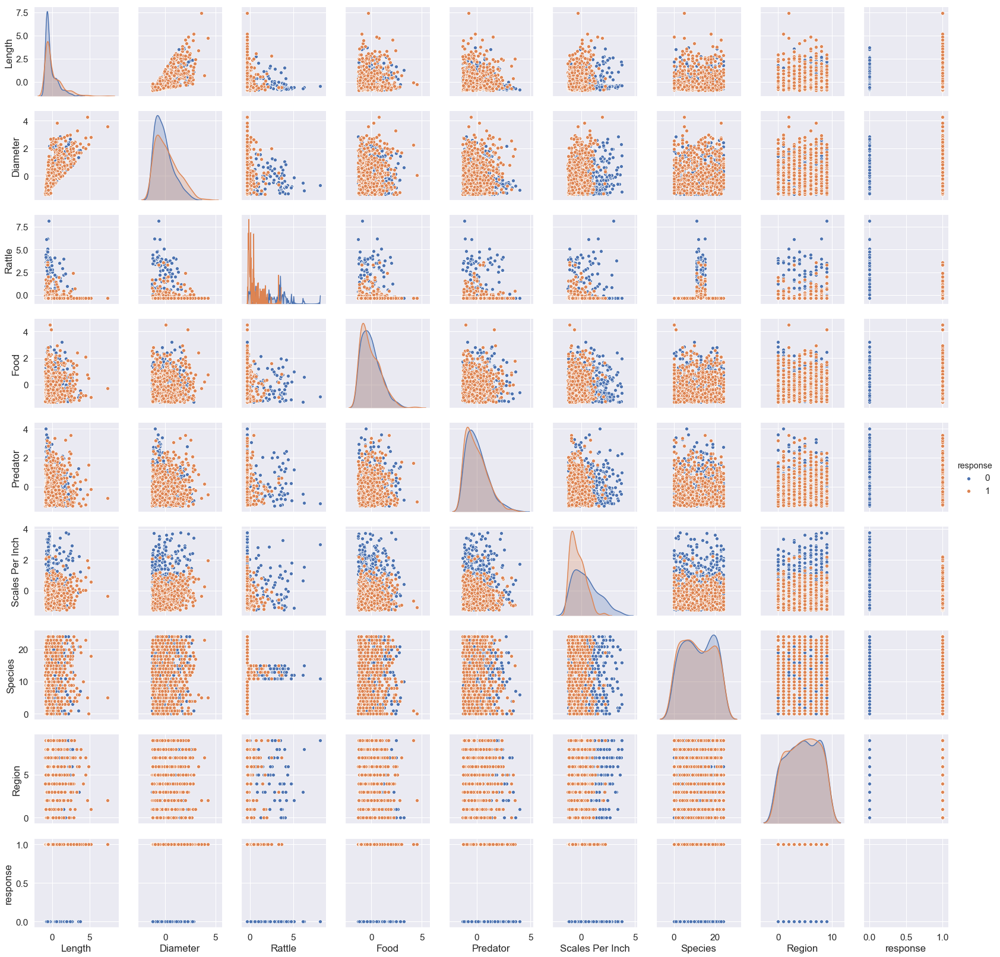

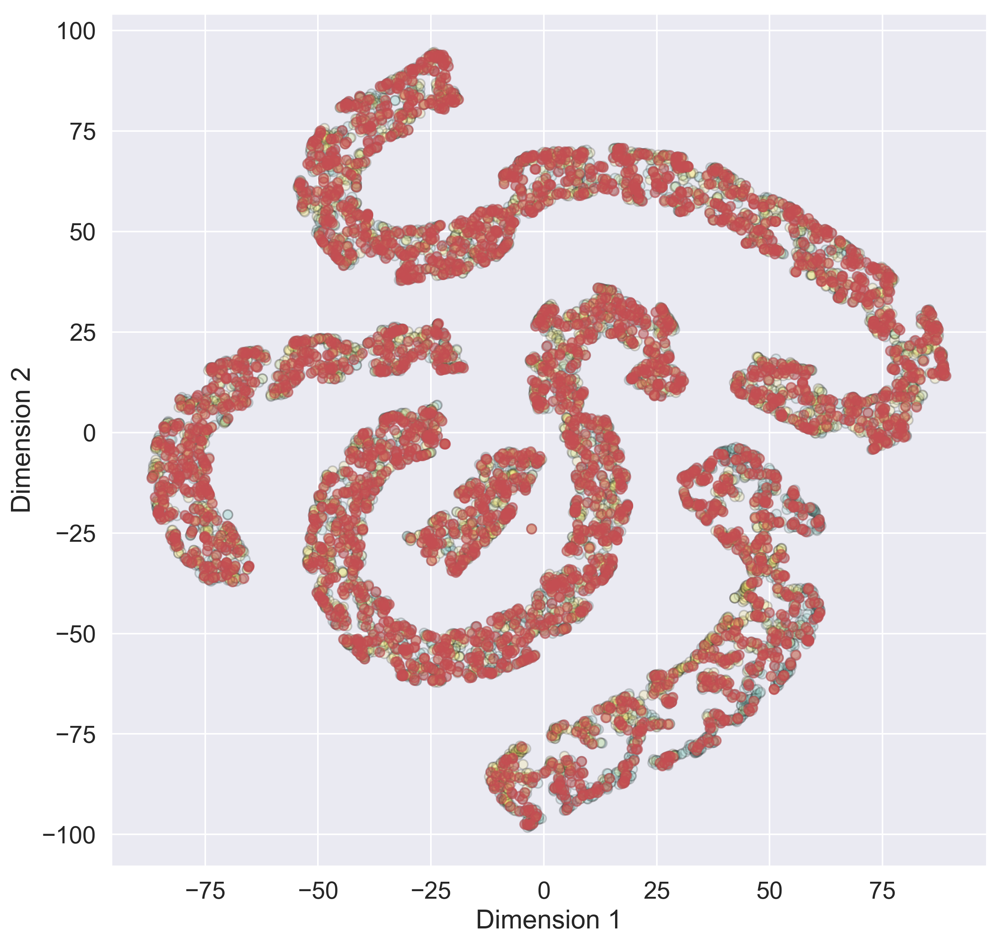

<Figure size 432x288 with 0 Axes>

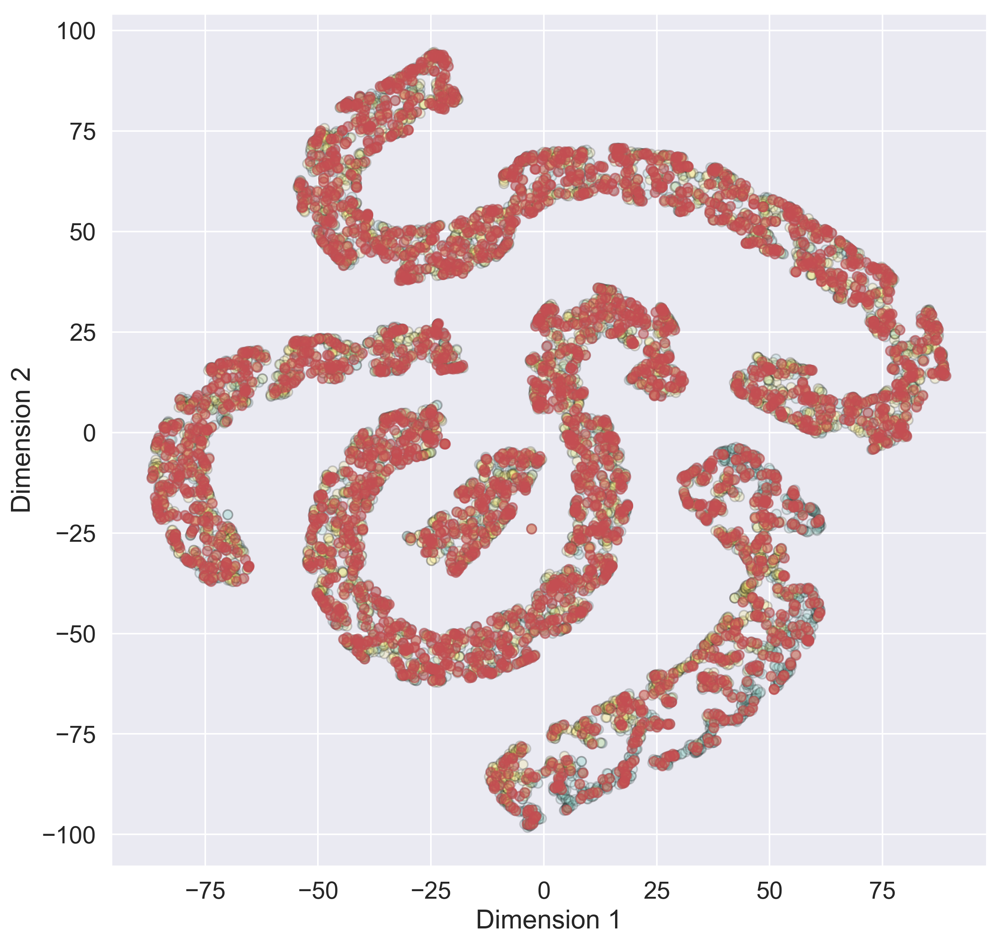

<Figure size 432x288 with 0 Axes>

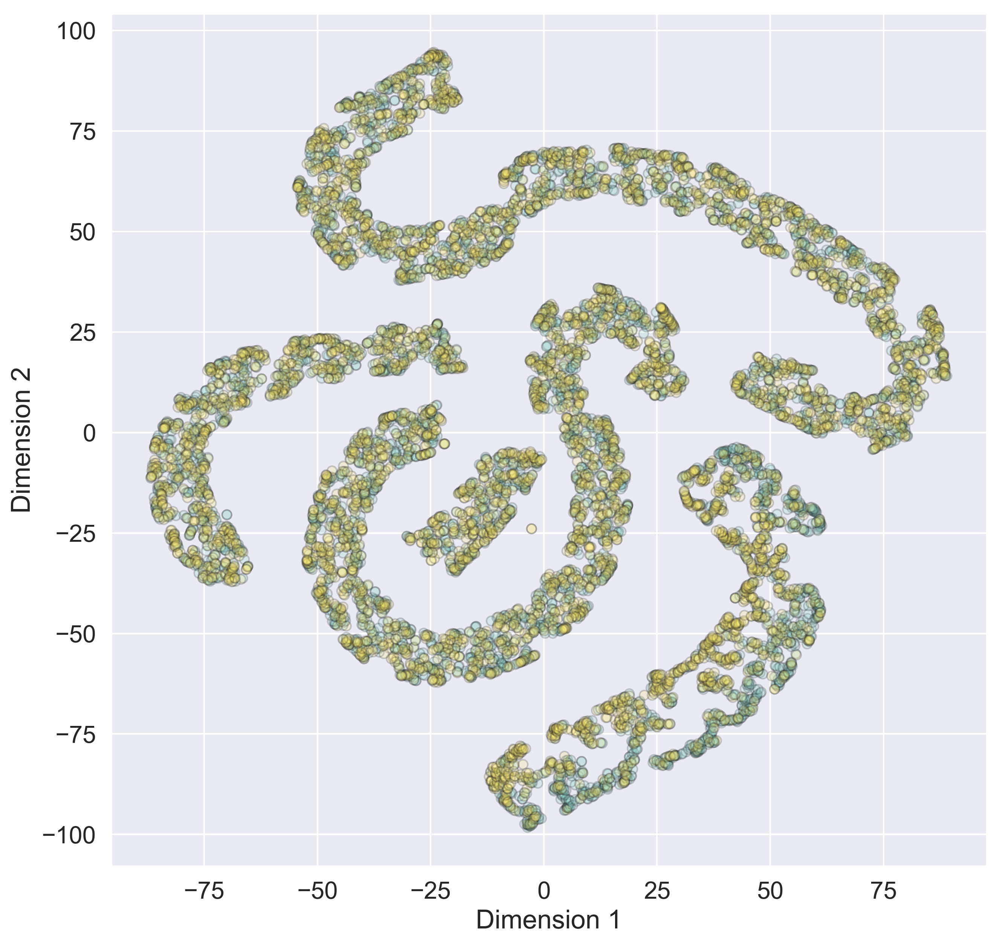

<Figure size 432x288 with 0 Axes>

In [38]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import MDS
from sklearn.manifold import TSNE
import sklearn.linear_model
from sklearn import tree
from sklearn import svm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


def plot_pairs(X,y):
    """
    generate pairplots by combining the predictors and response into a data frame
    input : X - predictors, y - response
    output : figure handle
    """
    print("Plotting pairs of response and predictors")
    fig = plt.figure(figsize=(10,10),dpi=300)
    # make a data frame for visualization
    df_scaled = pd.DataFrame(X)
    df_scaled['response'] = pd.Series(y)
    df_scaled = df_scaled.sample(1000)
    # visualize the data 
    ax = sns.pairplot(df_scaled, hue='response')
    return(ax)

def perform_fit(X,y,estimator):
    """
    fit the estimator function to the design matrix
    input : X - predictors, y - response, estimator - model specification
    output : classifier - estimator function fit to data using solver
             y_hat - predictions of response from classifer
    """
    print(estimator)
    classifier = estimator.fit(X,y)
    y_hat = classifier.predict(X)
    print("MAE:",np.sum(np.abs(y - y_hat)))
    return(classifier,y_hat)

# read data
df = pd.read_csv('~/Dropbox/packt/snakes_edit.csv')

# transform data to design matrix
X_train = df.drop(['Venom_ind','Venom'],axis=1)
y = df['Venom_ind']

# scale numeric data to have zero mean and unit variance
X_scaled_temp = X_train.loc[:,['Length','Diameter','Rattle','Food','Predator','Scales Per Inch']]
scaler = StandardScaler().fit(X_scaled_temp)
X_scaled_temp = scaler.transform(X_scaled_temp)
X_scaled = X_train
X_scaled.loc[:,['Length','Diameter','Rattle','Food','Predator','Scales Per Inch']] = X_scaled_temp

# visualize the data to determine which model to apply for classification
ax = plot_pairs(X_scaled.loc[:,['Length','Diameter','Rattle','Food','Predator',
                                 'Scales Per Inch','Species','Region']],y)
ax.savefig('pair_plots_acitivity.png',dpi=300)

# define estimator for logistic regression model
estimator = sklearn.linear_model.LogisticRegression(fit_intercept=True, n_jobs=2, solver='lbfgs', 
                                                    verbose=True, max_iter=300)
classifier_logistic, y_hat_logistic = perform_fit(X_scaled,y,estimator)

# define estimator for decision tree model
estimator = tree.DecisionTreeClassifier(max_depth=4)
classifier_decision_tree, y_hat_decision_tree = perform_fit(X_scaled,y,estimator)

# define estimator for Support vector model
estimator = svm.SVC(kernel='rbf', gamma='auto')
classifier_svm, y_hat_svm = perform_fit(X_train,y,estimator)

# embed data in two dimensions using Multidimensional scaling
embedding = MDS(n_components=2)
embedding = TSNE(n_components=2)
X_transformed = embedding.fit_transform(X_train)


def plot_decision_surface(X_transformed,y,y_hat):
    """
    plot decision surface of the classifier in transformed space
    input : X_tranformed - data embededded in two dimensions, 
            y - response, 
            y_hat - predictions of response from classifer
    output : fig - figure showing the decision surface in 2d with misclassifications
    """
    fig = plt.figure(figsize=(10,10),dpi=300)
    plt.rcParams.update({'font.size': 22})
    match = np.where(y!=y_hat)
    # plot the training points as circles
    plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c=y, edgecolors='k', cmap=plt.cm.Set3, alpha=0.2)
    # plot misclassified points with red outline
    plt.scatter(X_transformed[match, 0], X_transformed[match, 1], c='r', alpha=0.5)
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.show()
    return(fig)

# save decision surface plot for logistic regression
fig = plot_decision_surface(X_transformed,y,y_hat_logistic)
plt.figure(fig.number)
plt.savefig('logistic_activity.png',dpi=300)

# save decision surface plot for decision tree
fig = plot_decision_surface(X_transformed,y,y_hat_decision_tree)
plt.figure(fig.number)
plt.savefig('decision_acitivity.png',dpi=300)

# save decision surface plot for support vector machine
fig = plot_decision_surface(X_transformed,y,y_hat_svm)
plt.figure(fig.number)
plt.savefig('SVM_acitivity.png',dpi=300)

In [39]:
print(classifier_svm.classes_)
print(classifier_svm.class_weight_)
print(classifier_svm.n_support_)


[0 1]
[1. 1.]
[5005 4995]
